<a href="https://colab.research.google.com/github/RVasconcelosMiguel/PerceptionMapping/blob/main/Assignment2_part1_2024_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<Body>   
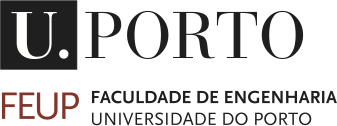   
<h1> <b>Perception and Mapping </b> </h1>
<p><b>Andry Maykol Pinto </b> (amgp@fe.up.pt)</p>
<p><b>Anibal C. Matos </b> (amgp@fe.up.pt)</p>
<p>Department of Electrical and Computer Engineering</p>
</Body>  
FEUP

---

# "Visual Inspection of Offshore Structures"

Unmanned Aerial Vehicles (UAVs) have revolutionized data collection for inspection and mapping, particularly in challenging environments. UAVs are capable of gathering high-resolution imagery, thermal data and LiDAR point clouds, making them valuable assets for surveying and monitoring offshore structures like oil platforms, CALM buoys, wind turbines, and coastal infrastructure.

For this assignment, you will work with a multi-modal dataset collected by a UAV as it inspects a CALM buoy - an offshore structure essential for mooring tankers and transferring oil in open waters. The dataset includes visual, thermal, and LiDAR data, all pre-calibrated and ready to use, offering an authentic setup that reflects real-world challenges faced in offshore inspection.

**Objectives**

To create a dense and accurately textured 3D representation of the CALM buoy, merging thermal and spatial data into a unified model that closely resembles the actual structure. Thermal imaging is essential for inspecting CALM buoys because it enables the detection of temperature anomalies that can indicate structural issues, such as corrosion, leaks or mechanical wear, which might not be visible through standard visual inspections.

1. Data Integration: You will work with a combination of thermal images, and LiDAR point clouds, requiring you to integrate these diverse data types into a cohesive pipeline.

2. Point Cloud Texturization: enhance the point cloud by applying textures derived from the UAV's captured imagery, by aligning 2D images onto the 3D structure without needing to implement blending techniques (keeping the emphasis on alignment within the scope of the course). This will give your 3D model a more realistic appearance. By representing the temperature in the point cloud data, thermal imaging can help identify potential hotspots or areas of heat loss that signify material degradation or damage.

3. Point Cloud Registration: register multiple point clouds from different UAV viewpoints. This involves aligning and merging individual point clouds into a cohesive model, overcoming the spatial variations inherent in data collected from different perspectives.


## Description of the dataset

This assignment use data collected by an Unmanned Aerial Vehicle (UAV) during the inspection routines of a offshore structure in the [ATLANTIS Test Centre](https://www.linkedin.com/company/68810369/). The data retrieved by the UAV includes:

* **Thermographic information**: obtained by a FLIR Boson Radiometric 640x512 resolution camera, with lens distortion model $D_t$ and intrinsic matrix ($K_t$).

* **LiDAR**: is the ouster [OS1-64](https://ouster.com/products/hardware/os1-lidar-sensor) which has 64 channels with a maximum range of 200 metres, a vertical FOV of 45° (± 22.5°) and a precision of ± 0.5 to 3 cm.

* **Visual information**: obtained by a 640x480 resolution camera, with the lens distortion model $D_v$ and intrinsic matrix ($K_v$).

> `Dv: [-0.21292081375160646, 0.1767752984756973, 0.00016650108739115778, -7.265397248140523e-05, -0.05302482500821179]`

> `Kv: [767.942728, 0.0, 339.436073232339, 0.0, 767.068789, 231.644928, 0.0, 0.0, 1.0]`

> `Dt: [-0.504042, 0.26894, 0.003454, -0.000748, 0.0]`

>`Kt: [791.177953960177, 0.0, 317.436073232339, 0.0, 791.2141134510654, 260.3051663940424, 0.0, 0.0, 1.0]`


The extrinsic calibration parameters of this sensor setup is the following:

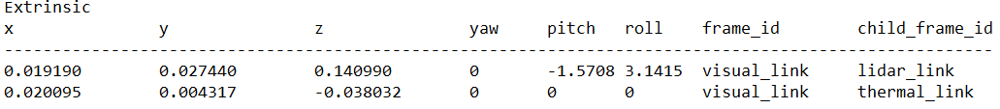

The visual, thermal and point clouds data is timestamped to be possible to select the visual, LiDAR and thermal data with closer timming. This timestamp is encoded directly in the filename of each JPEG or PCD file from the dataset.

* Visual images are named as “image_1693472857**485**557608”
* Point cloud (pcd files) are named as “pointcloud_1693472857**508**994”
* Thermal images are named as “image_1693472857**498**990366




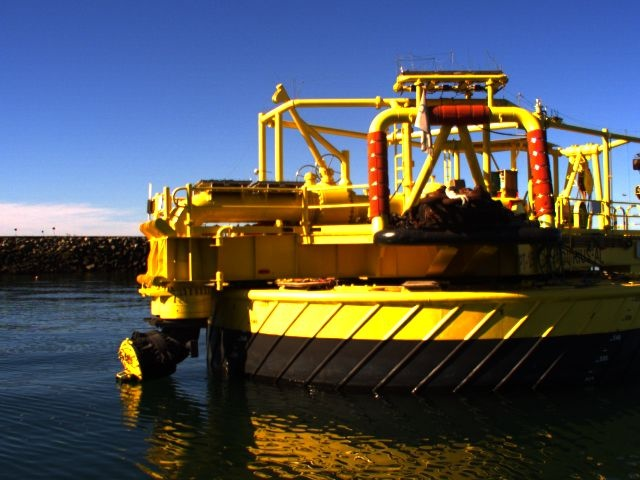

Figure 1 - Visual Images collected by UAV.

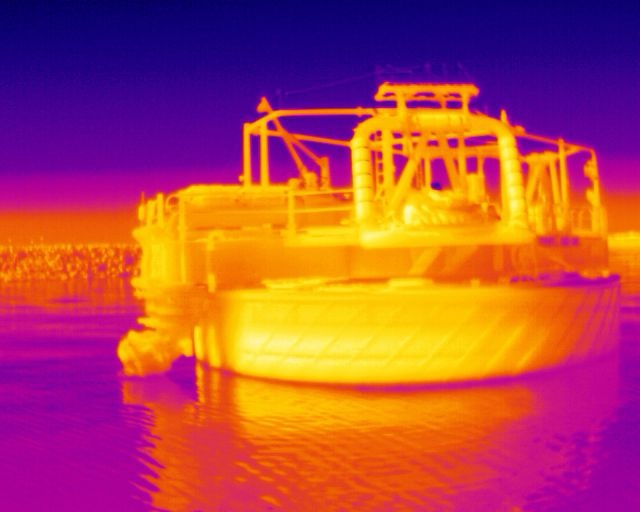

Figure 2 - Thermographic Images collected by UAV.

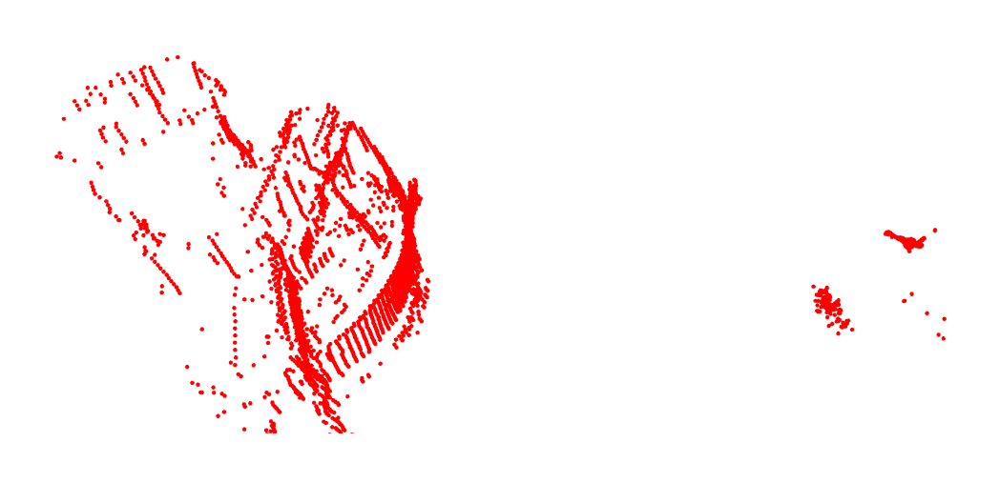

Figure 3 - Point cloud collected by UAV.

## Prepare Libraries and Download dataset

In [ ]:
# Install Open3D library
!pip install open3d

In [ ]:
# Import libraries
import numpy as np
import open3d as o3d
import copy

# Visualization
import plotly.graph_objects as go  # plotly to visualize since COLAB does not allow to use O3D functions
import matplotlib.pyplot as plt    # or, Matplotlib
from mpl_toolkits import mplot3d

import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

from scipy.spatial.transform import Rotation

In [ ]:
# Visualize point cloud as a scatter plot using matplotlib (as an image!)
def plot_pointcloud_matplotlib_singleview (pt, title_ = ' ', view_ =(-90, 90, 0)):
  colors = None
  if pt.has_colors():
      colors = np.asarray(pt.colors)
  elif pt.has_normals():
      colors = (0.5, 0.5, 0.5) + np.asarray(pt.normals) * 0.5
  else:
      pt.paint_uniform_color((1.0, 0.0, 0.0))
      colors = np.asarray(pt.colors)

  points = np.asarray(pt.points)
  # Single View
  ax = plt.axes(projection='3d')
  ax.view_init(view_[0], view_[1], view_[2])
  ax.axis("on")
  ax.scatter(points[:,0], points[:,1], points[:,2], c=colors)
  ax.set_xlabel('X axis')
  ax.set_ylabel('Y axis')
  ax.set_zlabel('Z axis')

  plt.title(title_)
  plt.show()

#Plotly
def draw_geometries(geometries):
    graph_objects = []

    for geometry in geometries:
        geometry_type = geometry.get_geometry_type()

        if geometry_type == o3d.geometry.Geometry.Type.PointCloud:
            points = np.asarray(geometry.points)
            colors = None
            if geometry.has_colors():
                colors = np.asarray(geometry.colors)
            elif geometry.has_normals():
                colors = (0.5, 0.5, 0.5) + np.asarray(geometry.normals) * 0.5
                geometry.colors = o3d.utility.Vector3dVector(colors)
            else:
                geometry.paint_uniform_color((1.0, 0.0, 0.0))
                colors = np.asarray(geometry.colors)

            scatter_3d = go.Scatter3d(x=points[:,0], y=points[:,1], z=points[:,2], mode='markers', marker=dict(size=2, color=colors))
            graph_objects.append(scatter_3d)

        if geometry_type == o3d.geometry.Geometry.Type.TriangleMesh:
            triangles = np.asarray(geometry.triangles)
            vertices = np.asarray(geometry.vertices)
            colors = None
            if geometry.has_triangle_normals():
                colors = (0.5, 0.5, 0.5) + np.asarray(geometry.triangle_normals) * 0.5
                colors = tuple(map(tuple, colors))
            else:
                colors = (1.0, 0.0, 0.0)

            mesh_3d = go.Mesh3d(x=vertices[:,0], y=vertices[:,1], z=vertices[:,2], i=triangles[:,0], j=triangles[:,1], k=triangles[:,2], facecolor=colors, opacity=0.50)
            graph_objects.append(mesh_3d)

        if geometry_type == o3d.geometry.Geometry.Type.VoxelGrid:
            bounds     = geometry.get_max_bound()-geometry.get_min_bound()

            voxels     = geometry.get_voxels()   # Returns List of Voxel
            vox_mesh   = o3d.geometry.TriangleMesh()

            for v in voxels:
                cube = o3d.geometry.TriangleMesh.create_box(width=1, height=1, depth=1)
                cube.paint_uniform_color(v.color)
                cube.translate(v.grid_index, relative=False)
                vox_mesh += cube

            vox_mesh.translate([0.5,0.5,0.5], relative=True)

            vox_mesh.merge_close_vertices(0.0000001)
            # T=np.array([[1, 0, 0, 0],[0, 0, 1, 0],[0, -1, 0, 0],[0, 0, 0, 1]])
            vox_mesh.translate(geometry.origin, relative=True)

            # Now is like a TriangleMesh
            triangles = np.asarray(vox_mesh.triangles)
            vertices = np.asarray(vox_mesh.vertices)
            colors = None
            if vox_mesh.has_triangle_normals():
                colors = (0.5, 0.5, 0.5) + np.asarray(vox_mesh.triangle_normals) * 0.5
                colors = tuple(map(tuple, colors))
            else:
                vox_mesh.compute_vertex_normals()
                colors = (0.5, 0.5, 0.5) + np.asarray(vox_mesh.triangle_normals) * 0.5
                colors = tuple(map(tuple, colors))                                        # or colors = (0, 0, 0)

            mesh_3d = go.Mesh3d(x=vertices[:,0], y=vertices[:,1], z=vertices[:,2], i=triangles[:,0], j=triangles[:,1], k=triangles[:,2], facecolor=colors, opacity=0.50)
            graph_objects.append(mesh_3d)

    fig = go.Figure(
        data=graph_objects,
        layout=dict(
            scene=dict(
                xaxis=dict(visible=False),
                yaxis=dict(visible=False),
                zaxis=dict(visible=False)
            )
        )
    )
    fig.show()

In [ ]:
o3d.visualization.draw_geometries = draw_geometries # replacing the function of Open3D

In [ ]:
!wget 'https://uporto-my.sharepoint.com/:u:/g/personal/up488707_up_pt/EU91jtOCygFFgkkekfz2MMUBEbT7RCV-VNYsfDG0Kqm7Lg?download=1' -O DURIUS_d1.zip

--2024-11-19 14:34:47--  https://uporto-my.sharepoint.com/:u:/g/personal/up488707_up_pt/EU91jtOCygFFgkkekfz2MMUBEbT7RCV-VNYsfDG0Kqm7Lg?download=1
Resolving uporto-my.sharepoint.com (uporto-my.sharepoint.com)... 13.107.136.10, 13.107.138.10, 2620:1ec:8f8::10, ...
Connecting to uporto-my.sharepoint.com (uporto-my.sharepoint.com)|13.107.136.10|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /personal/up488707_up_pt/Documents/AULAS/UC_Perception/DataSets/RAVEN/PM_dataset_DURIUS_RAVEN_data_1.zip?ga=1 [following]
--2024-11-19 14:34:48--  https://uporto-my.sharepoint.com/personal/up488707_up_pt/Documents/AULAS/UC_Perception/DataSets/RAVEN/PM_dataset_DURIUS_RAVEN_data_1.zip?ga=1
Reusing existing connection to uporto-my.sharepoint.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 81997028 (78M) [application/x-zip-compressed]
Saving to: ‘DURIUS_d1.zip’

DURIUS_d1.zip       100%[===================>]  78.20M  23.7MB/s    in 3.3s    

2024-11-19 14:34:5

In [ ]:
# Extract point clouds from ZIP file.
import zipfile
import os

with zipfile.ZipFile("DURIUS_d1.zip", mode="r") as archive:
  for file in archive.namelist():
    archive.extract(file, "dataset_uav/")

# Exercise 0 - Study and analysis of the sensor setup
Examine the perception system used by this UAV, which includes visual, thermal and LiDAR sensors. You can consult the datasheets of such sensors to support your technical discussion.







## 0.1 - Are there any challenge associated with this perception system?
>**Tip**: discuss the data integration, range, resolution, calibration and environmental factors, among others.

>**Tip**: max 7 sentences.

>**Tip**: provide all sources/references used.




This assignment focuses on processing and integrating multi-modal data collected by a UAV during an offshore structure inspection. The dataset includes thermographic images, LiDAR point clouds, and visual images captured by calibrated sensors. Our goal is to create a dense, textured 3D model of a CALM buoy, leveraging thermal data to identify potential structural issues.

We anticipate challenges in aligning and merging point clouds from different viewpoints, accurately texturing the 3D model, and integrating the thermal data. Our approach will involve data loading, preprocessing, point cloud registration, texturization, and potentially some visualization techniques.

Using UAVs for offshore inspection offers significant benefits in terms of safety, efficiency, and detailed insights, ultimately contributing to better maintenance and risk management

## 0.2 - Describe the process of calibrating different sensors to achieve accurate registration of the data from each sensor in a common coordinate system. Estimate the uncertainty induced by a 10cm range error in the lidar-to-thermal alignment procedure.

>**Tip**: Consider the minimum range of the LiDAR as 0.5m.

>**Tip**: max 5 sentences.

>**Tip**: provide all sources/references used.



<font color='red'> !!! Complete here!!! </font>

<font color='red'> !!! Complete here!!! </font>

<font color='red'> !!! Complete here!!! </font>

<font color='red'> !!! Complete here!!! </font>

<font color='red'> !!! Complete here!!! </font>


# Exercise 1 - Point Cloud Texturization
Point clouds provide a powerful representation of 3D environments, capturing the spatial structure of objects and scenes with precision. However, raw point clouds lack visual realism as they consist of untextured geometric points. The challenge in this problem is to develop a point cloud texturization process that enhances the visual quality of point cloud data by mapping 2D textures onto 3D surfaces.

>**Problem Overview:**

>Design a function that receives the point cloud and the image, and uses the extrinsic and intrinsic calibration data to obtain the texture information that will be used to colorize the point cloud acquired by the LiDAR.

> **Expected output:** a point cloud with RGB colors in each point. This RGB color must be obtained using the thermal data.






> **From now on, this project is focused only on Thermal and LiDAR data.**

## Loading Images and Point Clouds

Start by selecting a point cloud and a image with similar timestamps.

In [ ]:
DIR_PCL = "dataset_uav/data_1/PCD/"
DIR_RGB = "dataset_uav/data_1/RGB/"
DIR_THE = "dataset_uav/data_1/Thermal/"

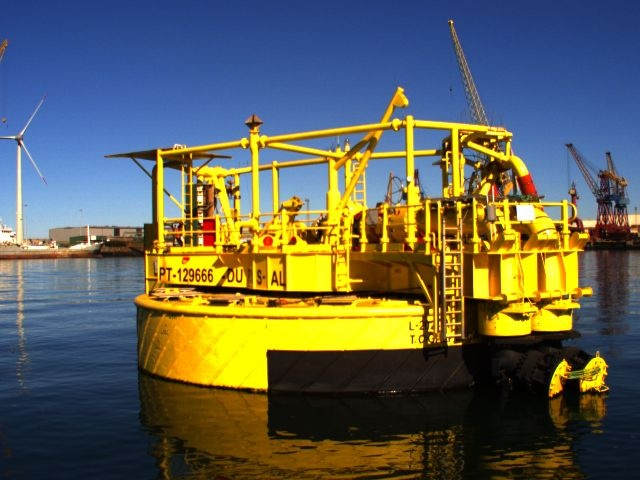

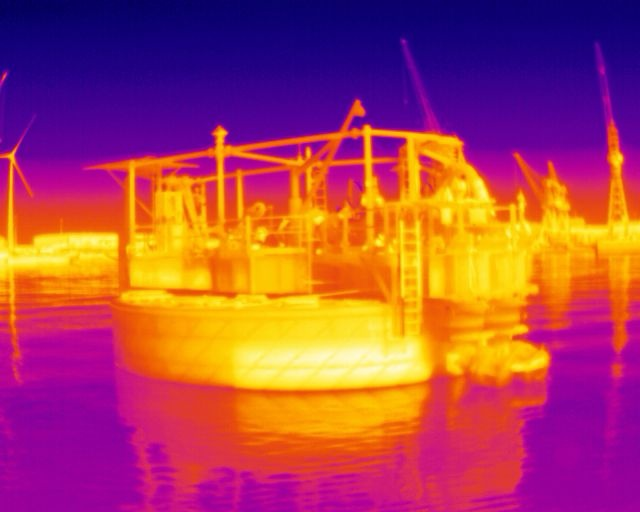

In [ ]:
"""
 this example: data is loaded individually. For loading many files --> glob library
"""

import cv2
from google.colab.patches import cv2_imshow
image = cv2.imread(DIR_RGB+"image_1693472857485557608.jpg")
cv2_imshow(image)


image_t = cv2.imread(DIR_THE+"image_1693472857498990366.jpg")
cv2_imshow(image_t)

#PERGUNTAR PQ A SEGUNDA PTC
# Load a PCD file as a point cloud
pt_example = o3d.io.read_point_cloud(DIR_PCL+"pointcloud_1693472857608952.pcd", format='pcd')
if pt_example.is_empty():
  exit()


In [ ]:
o3d.visualization.draw_geometries([pt_example])

### 1.1 Pre-processing the point cloud
Apply some pre-processing techniques to improve the quality of the 3D Data.


In [ ]:
def pt_cloud_preprocessing(pt_cloud):
  x_range = [13, 33]
  y_range = [-20, 20]
  z_range = [-20, 20]

  roi = o3d.geometry.AxisAlignedBoundingBox(min_bound=[x_range[0], y_range[0], z_range[0]],
                                            max_bound=[x_range[1], y_range[1], z_range[1]])
  # Crop the point cloud
  pt_cloud = pt_cloud.crop(roi)

  #cl, ind = pt_cloud.remove_statistical_outlier(nb_neighbors=20, std_ratio=2.0)
  # Optionally, keep only the inliers
  #pt_cloud = pt_cloud.select_by_index(ind)

  return pt_cloud

pt_cloud = copy.deepcopy(pt_example)

pt_cloud_preprocessed = pt_cloud_preprocessing(pt_cloud)
o3d.visualization.draw_geometries([pt_cloud_preprocessed])

### 1.2 Define the Intrinsic and Extrinsic matrices, and transform the data for different coordinates

Use the Open3D objects/methods to modify the coordinate system of the point cloud.


Extrinsic Matrix Visual lidar
[[ 0.      -0.       1.       0.01919]
 [ 0.      -1.      -0.       0.02744]
 [ 1.       0.      -0.       0.14099]
 [ 0.       0.       0.       1.     ]]

Extrinsic Matrix visual termal
[[ 1.        0.        0.        0.020095]
 [ 0.        1.        0.        0.004317]
 [ 0.        0.        1.       -0.038032]
 [ 0.        0.        0.        1.      ]]

Extrinsic Matrix termal visual
[[ 1.        0.        0.       -0.020095]
 [ 0.        1.        0.       -0.004317]
 [ 0.        0.        1.        0.038032]
 [ 0.        0.        0.        1.      ]]

Extrinsic Matrix lidar termal
[[ 0.       -0.        1.       -0.000905]
 [ 0.       -1.       -0.        0.023123]
 [ 1.        0.       -0.        0.179022]
 [ 0.        0.        0.        1.      ]]


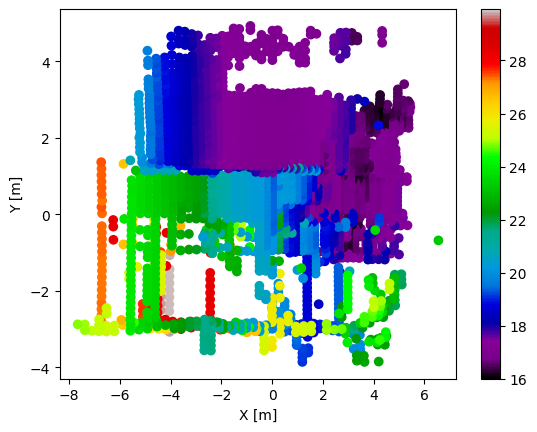

In [ ]:
import numpy as np
import open3d as o3d
from scipy.spatial.transform import Rotation

def rotation_matrix_from_yaw_pitch_roll(yaw, pitch, roll):
    # Rotation about Z-axis (yaw)
    R_z = np.array([
        [np.cos(yaw), -np.sin(yaw), 0],
        [np.sin(yaw), np.cos(yaw), 0],
        [0, 0, 1]
    ])

    # Rotation about Y-axis (pitch)
    R_y = np.array([
        [np.cos(pitch), 0, np.sin(pitch)],
        [0, 1, 0],
        [-np.sin(pitch), 0, np.cos(pitch)]
    ])

    # Rotation about X-axis (roll)
    R_x = np.array([
        [1, 0, 0],
        [0, np.cos(roll), -np.sin(roll)],
        [0, np.sin(roll), np.cos(roll)]
    ])

    # Combine rotations in ZYX order
    R = np.dot(R_z, np.dot(R_y, R_x))
    return R

def invert_homogeneous_matrix(H):
    R = H[:3, :3]  # Extract the rotation part
    t = H[:3, 3]   # Extract the translation part
    R_inv = R.T    # Transpose of the rotation matrix
    t_new = -R_inv @ t  # New translation
    H_inv = np.eye(4)   # Initialize a 4x4 identity matrix
    H_inv[:3, :3] = R_inv
    H_inv[:3, 3] = t_new
    return H_inv

camera_visual = o3d.camera.PinholeCameraIntrinsic(width = 640, height = 480, fx = 767.942728, fy = 767.068789, cx = 339.436073232339, cy = 231.644928)
camera_thermal = o3d.camera.PinholeCameraIntrinsic(width = 640, height = 512, fx = 791.177953960177, fy = 791.177953960177, cx = 317.436073232339, cy = 260.3051663940424)

pi=np.pi
extrinsic_matrix_visual_lidar = np.eye(4)
extrinsic_matrix_visual_lidar[:3, :3] = rotation_matrix_from_yaw_pitch_roll(0.0, -(pi)/2, pi)
extrinsic_matrix_visual_lidar[:3, 3] = [0.01919, 0.02744, 0.14099]

extrinsic_matrix_visual_thermal = np.eye(4)
extrinsic_matrix_visual_thermal[:3, :3] = o3d.geometry.get_rotation_matrix_from_xyz((0.0, 0.0, 0.0))
extrinsic_matrix_visual_thermal[:3, 3] = [0.020095, 0.004317, -0.038032]

extrinsic_matrix_termal_visual = invert_homogeneous_matrix(extrinsic_matrix_visual_thermal)

extrinsic_matrix_lidar_thermal = np.dot(extrinsic_matrix_termal_visual, extrinsic_matrix_visual_lidar)

#################################################
def pt_cloud_transform(pt_cloud):

  pt_cloud_transformed = copy.deepcopy(pt_cloud)
  pt_cloud_transformed.transform((extrinsic_matrix_lidar_thermal))
  points = np.asarray(pt_cloud_transformed.points)
  pt_cloud_transformed.points = o3d.utility.Vector3dVector(points)

  return points, pt_cloud_transformed

points, pt_cloud_transformed = pt_cloud_transform(pt_cloud_preprocessed)

np.set_printoptions(precision=7, suppress=True)

print("\nExtrinsic Matrix Visual lidar")
print(extrinsic_matrix_visual_lidar)

print("\nExtrinsic Matrix visual termal")
print(extrinsic_matrix_visual_thermal)

print("\nExtrinsic Matrix termal visual")
print(extrinsic_matrix_termal_visual)

print("\nExtrinsic Matrix lidar termal")
print(extrinsic_matrix_lidar_thermal)



#pt_cloud.points = o3d.utility.Vector3dVector(points)    PODE SER NECESSARIO
o3d.visualization.draw_geometries([pt_cloud_transformed])

fig, ax = plt.subplots()
sc = ax.scatter(points[:,0], points[:,1], c=points[:,2], cmap="nipy_spectral")
plt.xlabel("X [m]")
plt.ylabel("Y [m]")
plt.colorbar(sc)
plt.show()

### 1.3 Convert 3D Points to Image Plane, and show each 2D point in the RGB image

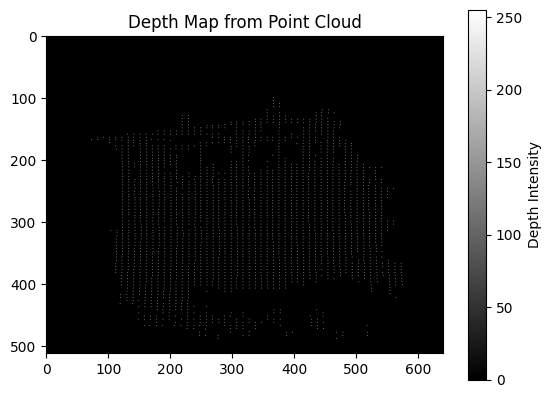

In [ ]:
def  project_points_to_image(ptc_cloud, camera):

  # Convert 3D Point to Pixel and Show the point in the RGB image
  pt_cloud = copy.deepcopy(ptc_cloud)
  range_map = np.zeros((camera.height, camera.width), dtype=np.uint8)
  depth_map_pt = []

  points = np.asarray(pt_cloud.points)

  # Define z-range for scaling the depth values
  z_max   = np.max(points[:, 2])
  z_min   = np.min(points[:, 2])
  z_scale = 255.0/(z_max - z_min)

  points_2d = np.dot(camera.intrinsic_matrix, points.T).T
  points_2d[:, 0] /= points_2d[:, 2]
  points_2d[:, 1] /= points_2d[:, 2]

  for i, (point_2d, point_3d) in enumerate(zip(points_2d, points)):

      # Extract pixel coordinates (u, v)
      u = int(point_2d[0])
      v = int(point_2d[1])

      # Check if the projected point is within the image boundaries
      if 0 <= u < camera.width and 0 <= v < camera.height:
          # Scale the depth to be in the range [0, 255]
          depth_value = 255
          range_map[v, u] = depth_value
          depth_map_pt.append((v, u, depth_value))

  return range_map, depth_map_pt, points_2d

# Show the range map as a grayscale image
range_map, depth_map_pt, points_2d = project_points_to_image(pt_cloud_transformed, camera_thermal)

plt.imshow(range_map, cmap='gray')
plt.title("Depth Map from Point Cloud")
plt.colorbar(label="Depth Intensity")
plt.show()


In [ ]:
pp_3D_2D_projection = np.array(depth_map_pt)
pt_image_projection        = o3d.geometry.PointCloud()
pt_image_projection.points = o3d.utility.Vector3dVector(pp_3D_2D_projection)

# Show the 3D -> 2D projection using OpenCV Color Map
range_map_color = cv2.applyColorMap(cv2.cvtColor(range_map, cv2.COLOR_GRAY2BGR), cv2.COLORMAP_HOT)

In [ ]:
def img_undistort(image):
  Dt = [-0.504042, 0.26894, 0.003454, -0.000748, 0.0]

  Kt = np.array(camera_thermal.intrinsic_matrix)
  Dt = np.array(Dt)

  # Undistort the image
  image = cv2.undistort(image, Kt, Dt)

  return image

image_t= img_undistort(image_t)

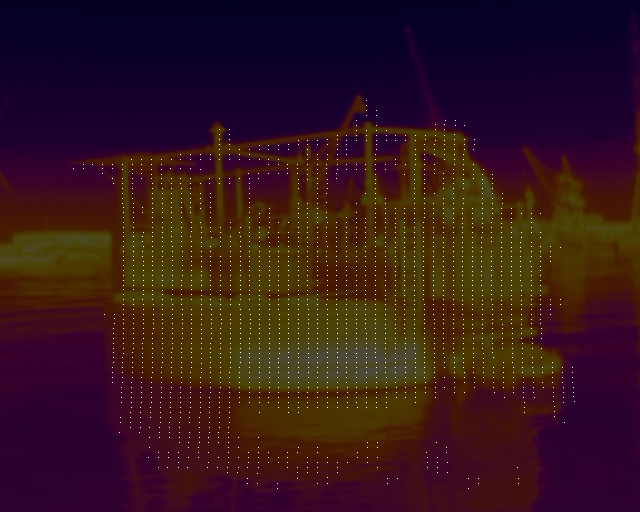

In [ ]:
#Showing results (do not change)
image_show = image_t.copy()
image_projection_color = image_show*0.3 + range_map_color*0.9
cv2_imshow(image_projection_color)

### 1.4 Colorize the Point cloud of the DURIUS taking into consideration the RGB data from the Image

In [ ]:
def point_cloud_colorization( image, points, points_2d, camera):
  # Colorize the Point Cloud of the DURIUS taking into consideration the RGB data from the Image
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  RGB_pt = []  # Must be normalized

  for i in range(points.shape[0]):
      # Extract 3D point and corresponding 2D projection
      point_3d = points[i]
      point_2d = points_2d[i]

      # Extract pixel coordinates (u, v)
      u = int(point_2d[0])
      v = int(point_2d[1])

      # Check if the projected point is within the image boundaries
      if 0 <= u < camera.width and 0 <= v < camera.height:
          color = image[v, u]  # (v, u) corresponds to (row, column) in the image
          normalized_color = color / 255.0
          RGB_pt.append(normalized_color)
      else:
        RGB_pt.append([0.0, 0.0, 0.0])

  return RGB_pt

pt_image_projection = copy.deepcopy(pt_cloud_transformed)
image_show = image_t.copy()

RGB_pt = point_cloud_colorization( image_show, points, points_2d, camera_thermal)



In [ ]:
#Showing results (do not change)
pt_image_projection.colors = o3d.utility.Vector3dVector(RGB_pt)
o3d.visualization.draw_geometries([pt_image_projection])

### 1.5 Save the final point cloud with texture

In [ ]:
o3d.io.write_point_cloud("final_point_cloud_with_texture.ply", pt_image_projection)

True

-

-

-

-

-

-

-

-

-----------------------------

In [ ]:
point_cloud = o3d.io.read_point_cloud("/content/final_point_cloud_with_texture.ply")
o3d.visualization.draw_geometries([point_cloud])

# Exercise 2 - Developing a 3D Registration Pipeline

The objective of this task is to design and implement a sophisticated colorized registration pipeline capable of aligning multiple point clouds, each containing corresponding color data, into a unified, high-fidelity 3D model. This system should not only achieve precise geometric alignment but also maintain color consistency across the merged point clouds, resulting in a realistic and information-rich 3D representation.


>**Problem Overview:**

> Develop a robust colorized point cloud registration system that can process multiple input point clouds, each with RGB color information enconding the temperature captured by the thermal camera, and integrate them into a single, coherent 3D model. The system must ensure both high geometric accuracy and color continuity, thereby enhancing the overall visual fidelity and informativeness of the reconstructed model.

> **Expected output:** the unified, colorized point cloud representing the DURIUS infrastructure, where each point is associated with accurate thermal values.

* **50% of penalization:** if *> 75% of all point clouds available* in the dataset are used to create the unified point cloud.

* **25% of penalization:** if *> 25% of all point clouds available* in the dataset are used to create the unified point cloud.

* **0% of penalization:** for implemementations that produce an unified point cloud using *only 10 point clouds retrieved uniformly from all dataset*.





## 2.1 Prepare the dataset that will be used for the registration

a) Select the raw point clouds and corresponding images required for the registration process.

b) Load and apply colorization to each point cloud using the function developed in Part 1 of this assignment.

c) Save each colorized point cloud, ensuring texture information is preserved. Clearly indicate the total number of processed point clouds.

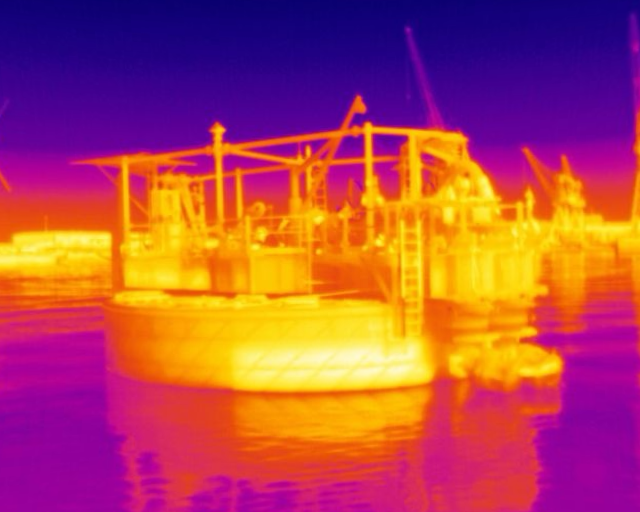

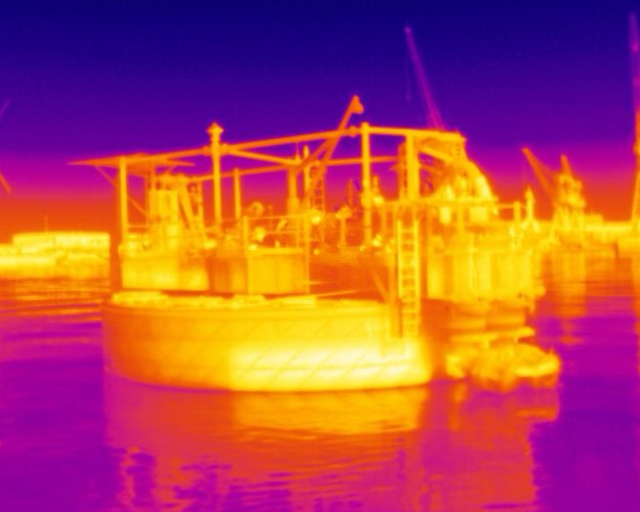

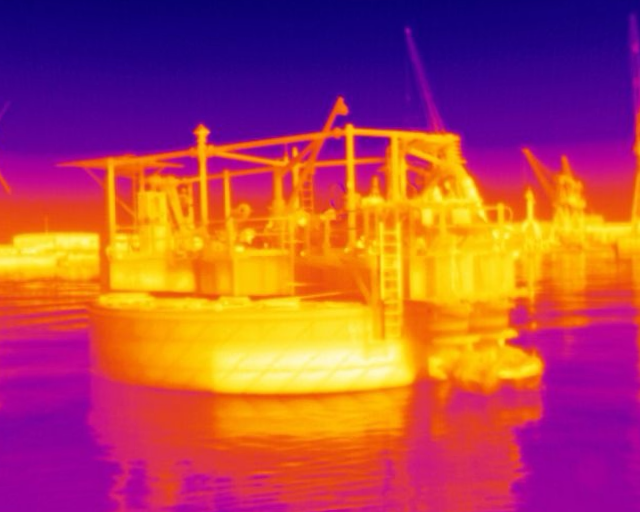

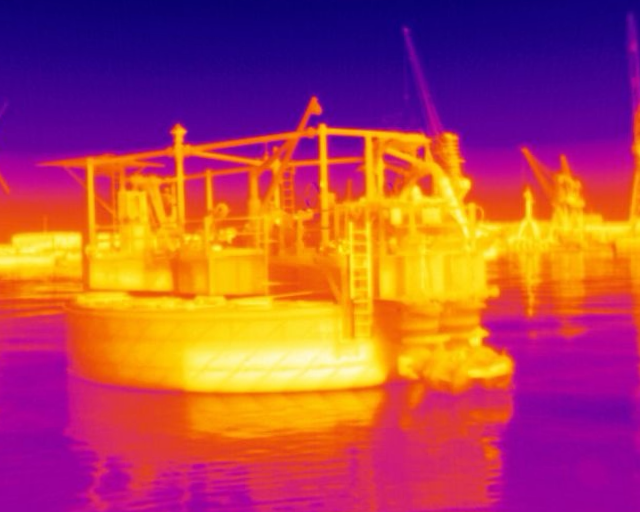

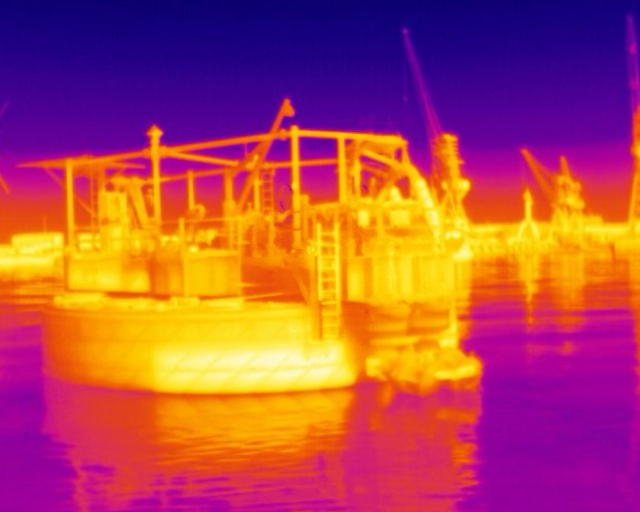

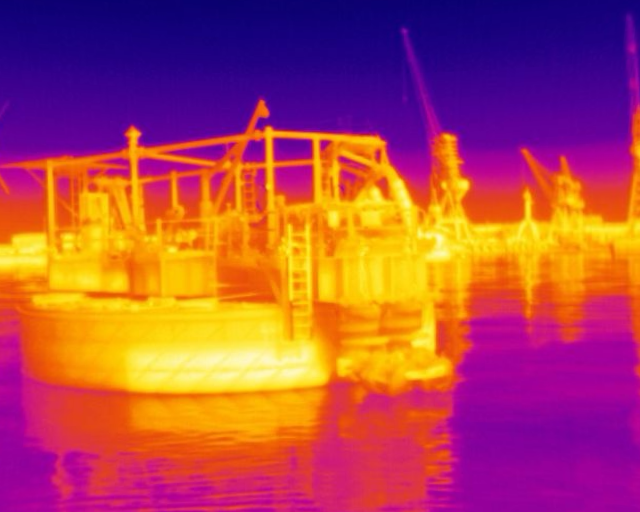

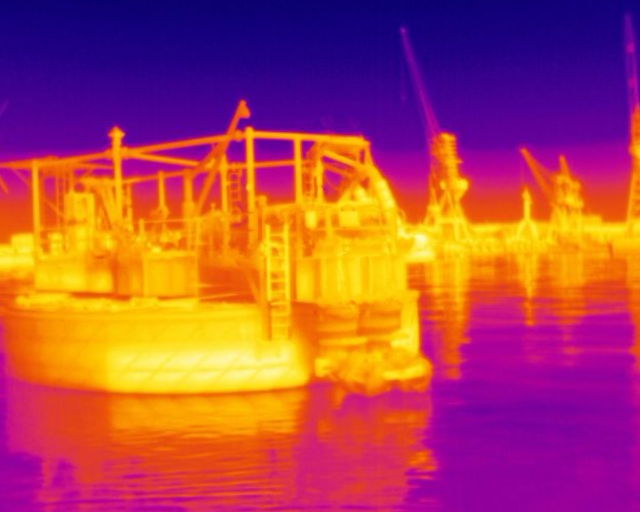

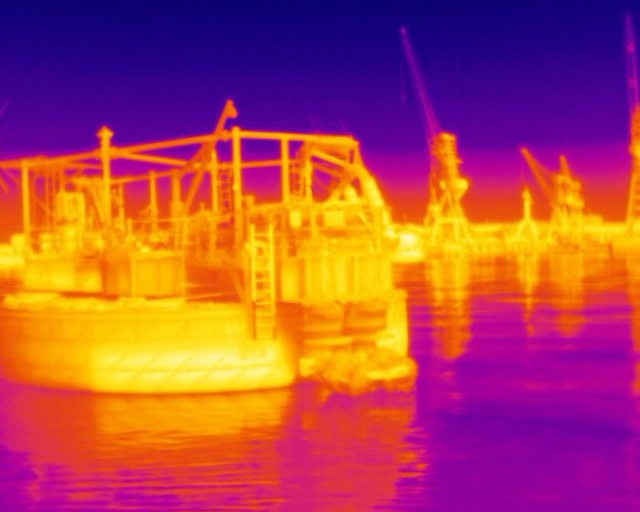

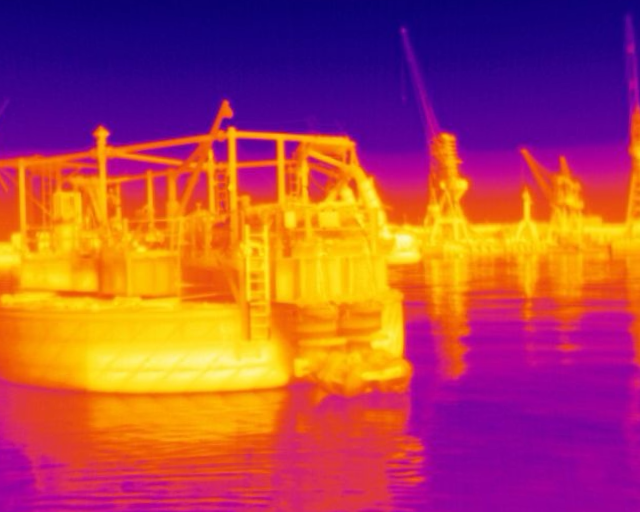

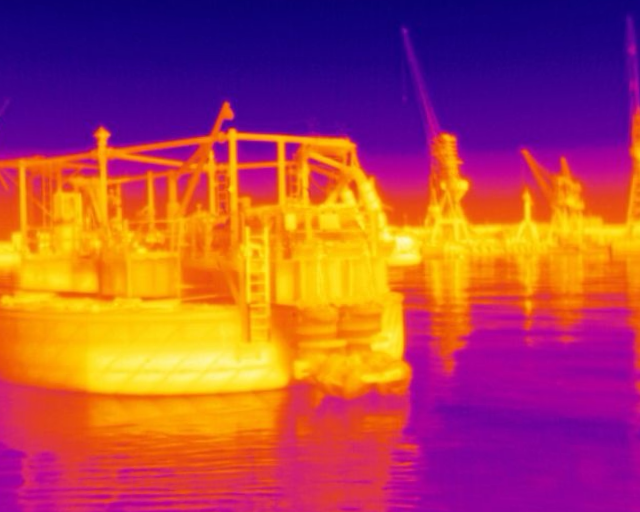

In [ ]:
import os

# Create folder if it doesnt exist
folder_path = "/content/point_clouds"

if not os.path.exists(folder_path):
    os.makedirs(folder_path)

# Get all filenames
pcl_files = sorted([f for f in os.listdir(DIR_PCL) if f.endswith('.pcd')])
the_files = sorted([f for f in os.listdir(DIR_THE) if f.endswith('.jpg')])


# Choosing 12 point clouds and respective RGB images
num_pointclouds = 10
indices = np.linspace(0, len(pcl_files) - 1, num_pointclouds, dtype=int)
selected_pcl_files = [pcl_files[i] for i in indices]
selected_the_files = [the_files[i] for i in indices]

for pcl_file, the_file in zip(selected_pcl_files, selected_the_files):
    # Load point cloud and RGB image
    pt_cloud = o3d.io.read_point_cloud(os.path.join(DIR_PCL, pcl_file))
    image_t = cv2.imread(os.path.join(DIR_THE, the_file))
    image_t = img_undistort(image_t)

    # Preprocess point cloud
    pt_cloud_preprocessed = pt_cloud_preprocessing(pt_cloud)


    # Transform point cloud
    points, pt_cloud_transformed = pt_cloud_transform(pt_cloud_preprocessed)

    # Convert 3D Points to Image Plane
    range_map, depth_map_pt, points_2d = project_points_to_image(pt_cloud_transformed, camera_thermal)

    # Colorize the point cloud
    RBG_pt = point_cloud_colorization( image_t, points, points_2d, camera_thermal)

    # Create the colorized point cloud
    pt_cloud_transformed.colors = o3d.utility.Vector3dVector(RBG_pt)
    cv2_imshow(image_t)
    o3d.visualization.draw_geometries([pt_cloud_transformed])

    # Store the processed point clouds

    output_file_path = os.path.join(folder_path, f"colored_{pcl_file}")
    o3d.io.write_point_cloud(output_file_path, pt_cloud_transformed)

**Number of point clouds used:**

<font color='red'> !!! Complete here!!! </font>


## 2.2 Estimate a transformation matrix for each point cloud

In [ ]:
#ICP MANUAL

from sklearn.neighbors import NearestNeighbors

def calculate_transform_lsq(A, B):
    '''
    Calculates the least-squares best-fit transform that maps corresponding points A to B in m spatial dimensions
    Input:
      A: Nxm numpy array of corresponding points
      B: Nxm numpy array of corresponding points
    Returns:
      T: (m+1)x(m+1) homogeneous transformation matrix that maps A on to B
      R: mxm rotation matrix
      t: mx1 translation vector
    '''
    assert A.shape == B.shape

    # get number of dimensions
    m = A.shape[1]

    # Calculate centroids
    centroid_A = np.mean(A, axis=0)
    centroid_B = np.mean(B, axis=0)

    # Align Points using centroids
    dist_A = A - centroid_A
    dist_B = B - centroid_B

    # Calculate Cross-Covariance Matrix
    # H = 1/m * (np.dot(dist_B.T, dist_A))
    H = 1/(A.shape[0]) * (np.dot(dist_B.T, dist_A))

    # Calculate SVD
    U, S, Vt = np.linalg.svd(H)

    # Calculate Rotation Matrix
    R = np.dot(U, Vt)

    # Calculate Translation
    t = centroid_B - np.dot(R, centroid_A)

    # homogeneous transformation
    T = np.identity(m+1)
    T[:m, :m] = R
    T[:m, m]  = t

    return T, R, t


def search_nearest_neighbor(src, dst):
    '''
    Find the nearest neighbor in dst for each point in src using Euclidean distance
    Input:
        src: Nxm array of points
        dst: Nxm array of points
    Output:
        distances: Euclidean distances of the nearest neighbor
        indices: dst indices of the nearest neighbor
    '''
    # assert src.shape == dst.shape

    # https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.NearestNeighbors.html
    neigh = NearestNeighbors(n_neighbors=1)
    neigh.fit(dst)
    distances, indices = neigh.kneighbors(src, return_distance=True)
    return distances.ravel(), indices.ravel()


def calculte_transform_icp(A, B, init_pose=None, max_iterations=20, tolerance=0.001):
    '''
    The Iterative Closest Point method: finds best-fit transform that maps points A on to points B
    Input:
        A: Nxm numpy array of source mD points
        B: Nxm numpy array of destination mD point
        init_pose: (m+1)x(m+1) homogeneous transformation
        max_iterations: exit algorithm after max_iterations
        tolerance: convergence criteria
    Output:
        T: final homogeneous transformation that maps A on to B
        distances: Euclidean distances (errors) of the nearest neighbor
        i: number of iterations to converge
    '''

    # Point clouds must have the same size
    # assert A.shape == B.shape

    # Number of dimensions of the point cloud
    m = A.shape[1]

    Tr = np.diag(np.ones(4), 0)

    # Use homogeneous points and copy them to maintain the originals
    src       = np.ones((m+1,A.shape[0]))
    dst       = np.ones((m+1,B.shape[0]))
    src[:m,:] = np.copy(A.T)
    dst[:m,:] = np.copy(B.T)
    src_iter  = np.copy(src)

    prev_error = 0

    # Consider the initial alignment transformation to source point cloud.
    if init_pose is not None:
        Tr  = init_pose

    # Iterate with a stop criteria: max_iterations
    for i in range(max_iterations):
        distances, indexes = search_nearest_neighbor(src[:m, :].T, dst[:m, :].T)

        tempTr, R, t = calculate_transform_lsq(src[:m, :].T, dst[:m, indexes].T)

        mean_error = np.linalg.norm((np.dot(R, A.T).T + t) - B)

        # Stop criteria: divergence - if error increases by 5%
        if (mean_error/(prev_error+0.0001) > 1.05) and (i > 2):
            break

        #Save the transformation from the actual source cloudpoint to the destination
        src = np.dot(tempTr, src)
        Tr = np.dot(tempTr, Tr)

        # Stop criteria: convergence - check evolution of error
        if np.abs(prev_error - mean_error) < tolerance:
            break
        prev_error = mean_error

    return Tr, distances, i


In [ ]:
import open3d as o3d
import numpy as np
import os



# Lista para armazenar as nuvens de pontos
pt_s = []

# Carregar as nuvens de pontos de todos os arquivos .pcd na pasta
file_list = [f for f in os.listdir(folder_path) if f.endswith('.pcd')]
for file_name in file_list:
    file_path = os.path.join(folder_path, file_name)
    point_cloud = o3d.io.read_point_cloud(file_path)
    pt_s.append(point_cloud)

# Lista para armazenar as transformações acumuladas
transformations = []

# Alinhar todas as nuvens de pontos em relação à primeira nuvem (pt_s[0])
for icloud in range(1, len(pt_s)):  # Começamos do segundo ponto (index 1)
    source_file_name = file_list[icloud]  # A nuvem de pontos atual será a fonte
    target_file_name = file_list[0]      # A primeira nuvem de pontos será o alvo

    print(f"Processing: Source - {source_file_name}, Target - {target_file_name}")

    # Avaliação inicial do alinhamento (antes do ICP)
    evaluation_start = o3d.pipelines.registration.evaluate_registration(
        source=pt_s[icloud],    # A nuvem de pontos atual será a fonte
        target=pt_s[0],         # A primeira nuvem de pontos será o alvo
        max_correspondence_distance=0.05
    )

    # Aplicar ICP para alinhar a nuvem de pontos `source` com a `target` (pt_s[0])
    reg_p2p = o3d.pipelines.registration.registration_icp(
        source=pt_s[icloud],    # A nuvem de pontos atual será a fonte
        target=pt_s[0],         # A primeira nuvem de pontos será o alvo
        max_correspondence_distance=0.05,
        init=np.eye(4),  # Inicializamos com a transformação identidade
        estimation_method=o3d.pipelines.registration.TransformationEstimationPointToPoint()
    )

    print(f"Fitness: {reg_p2p.fitness}")
    print(f"Inlier RMSE: {reg_p2p.inlier_rmse}")

    # Avaliação final após o ICP
    evaluation_end = o3d.pipelines.registration.evaluate_registration(
        source=pt_s[icloud].transform(reg_p2p.transformation),  # Aplica a transformação na fonte
        target=pt_s[0],  # A primeira nuvem de pontos será o alvo
        max_correspondence_distance=0.05
    )

    # Armazenar a transformação
    transformations.append(reg_p2p.transformation)

    # Estatísticas
    print('Initial guess:', evaluation_start)
    print('After ICP:', evaluation_end)
    print('Transformation:', reg_p2p.transformation)

Processing: Source - colored_pointcloud_1693472868508849.pcd, Target - colored_pointcloud_1693472866008728.pcd
Fitness: 0.5638350720317934
Inlier RMSE: 0.0241292680416733
Initial guess: RegistrationResult with fitness=5.608544e-01, inlier_rmse=2.497790e-02, and correspondence_set size of 1129
Access transformation to get result.
After ICP: RegistrationResult with fitness=5.638351e-01, inlier_rmse=2.412927e-02, and correspondence_set size of 1135
Access transformation to get result.
Transformation: [[ 0.9999996  0.0003242  0.0007763 -0.0146544]
 [-0.0003241  0.9999999 -0.0000354 -0.0006676]
 [-0.0007763  0.0000352  0.9999997 -0.0106246]
 [ 0.         0.         0.         1.       ]]
Processing: Source - colored_pointcloud_1693472862307974.pcd, Target - colored_pointcloud_1693472866008728.pcd
Fitness: 0.02939825447864033
Inlier RMSE: 0.026923595439653267
Initial guess: RegistrationResult with fitness=2.802021e-02, inlier_rmse=2.687165e-02, and correspondence_set size of 61
Access transf

## 2.3 Concatenate the points of all point clouds and create the  unified point cloud.

In [ ]:
import open3d as o3d
import numpy as np

all_points = []
all_colors = []

# Alinhar todas as nuvens de pontos em relação à primeira nuvem (pt_s[0])
for i, cloud in enumerate(pt_s):
    if i == 0:
        # Para a primeira nuvem, não aplicamos nenhuma transformação
        all_points.append(np.asarray(cloud.points))
        all_colors.append(np.asarray(cloud.colors))
    else:
        # Aplicar a transformação acumulada para alinhar a nuvem com pt_s[0]
        cloud.transform(transformations[i - 1])  # Aplicamos a transformação acumulada

        # Adiciona os pontos e cores da nuvem transformada
        all_points.append(np.asarray(cloud.points))
        all_colors.append(np.asarray(cloud.colors))

# Concatenar todos os pontos e cores em arrays únicos
all_points = np.vstack(all_points)
all_colors = np.vstack(all_colors)

# Criar uma nova nuvem de pontos unificada
pt_registered = o3d.geometry.PointCloud()
pt_registered.points = o3d.utility.Vector3dVector(all_points)
pt_registered.colors = o3d.utility.Vector3dVector(all_colors)

In [ ]:
#Showing results (do not change)
o3d.visualization.draw_geometries([pt_registered])

## 2.4 Post-processing the registered point cloud

In [ ]:
pt_cloud_registered_filtered = pt_registered.voxel_down_sample(voxel_size = 0.25)

o3d.visualization.draw_geometries([pt_cloud_registered_filtered])


def generate_mesh(input_cloud, depth=9, min_depth=5, linear_fit=False):

    print('run Poisson surface reconstruction')
    input_cloud.estimate_normals()
    with o3d.utility.VerbosityContextManager(o3d.utility.VerbosityLevel.Debug) as cm:
        mesh, densities = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(input_cloud, depth=9)
    print(mesh)

    return mesh

mesh = generate_mesh(pt_cloud_registered_filtered)
o3d.visualization.draw_geometries([mesh])

run Poisson surface reconstruction
[Open3D DEBUG] Input Points / Samples: 8662 / 8658
[Open3D DEBUG] #   Got kernel density: 0.16359806060791016 (s), 425.95703125 (MB) / 427.51953125 (MB) / 432 (MB)
[Open3D DEBUG] #     Got normal field: 0.2160358428955078 (s), 425.95703125 (MB) / 427.51953125 (MB) / 432 (MB)
[Open3D DEBUG] Point weight / Estimated Area: 3.261137e-04 / 2.824796e+00
[Open3D DEBUG] #       Finalized tree: 0.43559789657592773 (s), 425.95703125 (MB) / 427.51953125 (MB) / 432 (MB)
[Open3D DEBUG] #  Set FEM constraints: 1.5247008800506592 (s), 425.95703125 (MB) / 427.51953125 (MB) / 432 (MB)
[Open3D DEBUG] #Set point constraints: 0.21495509147644043 (s), 425.95703125 (MB) / 427.51953125 (MB) / 432 (MB)
[Open3D DEBUG] Leaf Nodes / Active Nodes / Ghost Nodes: 334783 / 150576 / 232033
[Open3D DEBUG] Memory Usage: 425.957 MB
[Open3D DEBUG] # Linear system solved: 3.459322929382324 (s), 425.95703125 (MB) / 427.51953125 (MB) / 432 (MB)
[Open3D DEBUG] Got average: 0.083290815353393

In [ ]:
#Showing results (do not change)
o3d.visualization.draw_geometries([pt_cloud_registered_filtered])
print(pt_cloud_registered_filtered)

PointCloud with 8662 points.


## 2.5 Save the unified point cloud of DURIUS

In [ ]:
o3d.io.write_point_cloud("pc_ex1.pcd", pt_cloud_registered_filtered)

True

## 2.6 Comment the results obtained and identify potential improvements

>**Tip**: max 5 sentences.

>**Tip**: provide all sources/references used.

<font color='red'> !!! Complete here!!! </font>

<font color='red'> !!! Complete here!!! </font>

<font color='red'> !!! Complete here!!! </font>

<font color='red'> !!! Complete here!!! </font>

<font color='red'> !!! Complete here!!! </font>

-----------------
-----------------
-----------------


It's DONE!

**Instructions for submitting this work:**
* This colab file must be executed before the delivery.

* The code must be ready to run without permissions for accessing shared folders.

* To avoid problems with the Plotly, please encode an image in this colab (from printscreen) for each core result that you have.

* Deliver also in the Moodle the unified point cloud.
--------------------------

<font color='red'>
Disclaimer for the use of AI tools: complete the text that is placed in between brackets. Convert this disclaimer to PDF, sign it and deliver the PDF in Moodle.
</font>

I, [Student Name], declare that the work presented in this assignment titled "[Assignment Title]" was completed independently, except where explicitly noted. I confirm the following with regard to the use of AI tools:

**Extent of AI Tool Contribution:**

I have used the following AI tool(s) for assistance in this assignment:

1. Tool(s) Used: [List AI tools used, e.g., ChatGPT, Grammarly, QuillBot, etc.]
Nature of Assistance: [Specify the task(s) for which the AI tool was used, e.g., brainstorming ideas, refining language, generating summaries, grammar correction, etc.]
2. Percentage of AI Contribution: [Estimate the percentage of the assignment influenced by the AI tool.]
3. Human Oversight and Contribution:
Despite the use of AI tools, I confirm that the critical thinking, analysis, problem-solving, and final decision-making processes in this assignment were carried out by me. The AI tools were used solely as support for the following purposes: [Elaborate on how the AI tool helped, e.g., improving readability, offering suggestions for structure, or enhancing clarity.]


**Originality and Integrity:**
I take full responsibility for ensuring that the content of this assignment is original and properly cited where applicable. The use of AI tools did not result in any unintentional plagiarism or misrepresentation of ideas from external sources.

**Compliance with Academic Integrity Guidelines:**
I understand the importance of academic integrity, and I confirm that the usage of AI tools complies with the guidelines provided by [School/University Name]. All AI-generated outputs were critically evaluated and appropriately incorporated into the final submission.

Signed,
[Student Name]
[Date]